In [0]:
%python
#Loading Dataset
import urllib
reset = True
data_id = 57

 
dbutils.fs.rm("dbfs:/FileStore/tables/ml36/customer_churn_labels", True)
dbutils.fs.rm("dbfs:/FileStore/tables/ml36/customer_reference_grid", True)
dbutils.fs.rm("dbfs:/FileStore/tables/ml36/lagged_features", True)
dbutils.fs.rm("dbfs:/FileStore/tables/ml36/most_frequent_category_12w", True)
exec(urllib.request.urlopen('https://drive.google.com/uc?export=download&id=151MlxWk3Nk-Q3emLDyOFRxPA8lCqgGt-').read())

Initaializing ml57 database.... on first run this will take a couple of minutes.
Loaded table: churn_features_final
Removing: churn_features_final
Loaded table: customer_churn_labels
Removing: customer_churn_labels
Loaded table: customer_reference_grid
Removing: customer_reference_grid
Loaded table: customers
Removing: customers
Loaded table: lagged_features
Removing: lagged_features
Loaded table: most_frequent_category_12w
Removing: most_frequent_category_12w
Loaded table: products
Removing: products
Loaded table: receipt_lines
Removing: receipt_lines
Loaded table: receipts
Removing: receipts
Loaded table: stores
Removing: stores
Done.

Your individual report for this dataset can be downloaded by clicking the link / copying the URL into a browser:


<string>:116: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display


https://community.cloud.databricks.com/files/ConsultingCorp_Report_ml57.pdf?o=104476679206065

All tables from your dataset as listed below. Tables are linked with one-to-many relationships when the field names are the same. Use the SQL:
SHOW TABLES
to list all tables, including those you have generated.
┏━━━━━━━━━━━━━┓
┃ customers   ┃
┣━━━━━━━━━━━━━┫
┃ customer_id ┃
┃ first       ┃
┃ last        ┃
┃ dob         ┃
┗━━━━━━━━━━━━━┛
┏━━━━━━━━━━━━━━━━━━━━━━┓
┃ products             ┃
┣━━━━━━━━━━━━━━━━━━━━━━┫
┃ product_code         ┃
┃ product_details      ┃
┃ department_code      ┃
┃ department_name      ┃
┃ category_code        ┃
┃ category_details     ┃
┃ sub_category_code    ┃
┃ sub_category_details ┃
┗━━━━━━━━━━━━━━━━━━━━━━┛
┏━━━━━━━━━━━━━━━━━┓
┃ receipt_lines   ┃
┣━━━━━━━━━━━━━━━━━┫
┃ receipt_line_id ┃
┃ receipt_id      ┃
┃ product_code    ┃
┃ qty             ┃
┃ value           ┃
┗━━━━━━━━━━━━━━━━━┛
┏━━━━━━━━━━━━━━┓
┃ receipts     ┃
┣━━━━━━━━━━━━━━┫
┃ receipt_id   ┃
┃ purchased_at ┃
┃ customer_id  ┃
┃ store_code   ┃
┃ till_number  ┃
┗━━━━━━━━━━━━━━┛
┏━━━━━━━━━━━━┓
┃ stores     

In [0]:
%sql
--  shopping start dates and end dates for different stores
SELECT store_code
      , MIN(purchased_at)
      , MAX(purchased_at)
      , date_diff(MAX(purchased_at),MIN(purchased_at)) AS expected_days
      , COUNT(DISTINCT purchased_at) days_have
      , date_diff(MAX(purchased_at),MIN(purchased_at)) - COUNT(DISTINCT purchased_at) missing_days
FROM receipts
GROUP BY 1

store_code,min(purchased_at),max(purchased_at),expected_days,days_have,missing_days
1,2020-07-22,2022-03-22,608,603,5
3,2020-07-22,2022-03-22,608,605,3
2,2020-07-22,2022-03-22,608,605,3
0,2020-10-14,2022-03-22,524,522,2


In [0]:
%sql
-- Checking Number of unique customers
SELECT COUNT(DISTINCT customer_id) AS n_customers FROM customers;

n_customers
9288


In [0]:
%sql
-- Checking Number of unique products
SELECT COUNT(DISTINCT product_code) AS n_products FROM products;



n_products
19823


In [0]:
%sql
-- Set churn inactivity period,as beta = 42 days
-- Generate weekly reference dates over the store's date range
CREATE OR REPLACE TEMP VIEW reference_dates AS
SELECT
  explode(sequence(
    to_date('2020-07-22'),
    to_date('2022-03-22'),
    interval 7 day
  )) AS reference_date;

-- Create a customer-reference date grid for all customers and all reference dates
CREATE OR REPLACE TABLE customer_reference_grid AS
SELECT
  c.customer_id,
  r.reference_date
FROM
  (SELECT DISTINCT customer_id FROM receipts) c
CROSS JOIN
  reference_dates r;

-- Find the last purchase date for each customer before the reference date
CREATE OR REPLACE TEMP VIEW last_purchase_before_ref AS
SELECT
  grid.customer_id,
  grid.reference_date,
  MAX(r.purchased_at) AS last_purchase_date
FROM
  customer_reference_grid grid
LEFT JOIN
  receipts r
  ON grid.customer_id = r.customer_id
     AND r.purchased_at < grid.reference_date
GROUP BY
  grid.customer_id, grid.reference_date;

-- Find the next purchase after each reference date 
CREATE OR REPLACE TEMP VIEW next_purchase_after_ref AS
SELECT
  grid.customer_id,
  grid.reference_date,
  MIN(r.purchased_at) AS next_purchase_date
FROM
  customer_reference_grid grid
LEFT JOIN
  receipts r
  ON grid.customer_id = r.customer_id
     AND r.purchased_at > grid.reference_date
GROUP BY
  grid.customer_id, grid.reference_date;

-- Create the churn label: 1 if no purchase within 42 days after reference_date, else 0
CREATE OR REPLACE TABLE customer_churn_labels AS
SELECT
  l.customer_id,
  l.reference_date,
  CASE
    WHEN n.next_purchase_date IS NULL THEN 1 
    WHEN datediff(n.next_purchase_date, l.reference_date) > 42 THEN 1 -- inactive >42 days
    ELSE 0
  END AS churn_label
FROM
  last_purchase_before_ref l
LEFT JOIN
  next_purchase_after_ref n
  ON l.customer_id = n.customer_id AND l.reference_date = n.reference_date;


num_affected_rows,num_inserted_rows


In [0]:
%python

#Checking Class Distribution
churn_df = spark.table("customer_churn_labels").toPandas()
print("Class distribution:\n", churn_df['churn_label'].value_counts(normalize=True))

# Converting churn label to CSV for modeling steps
churn_df.to_csv("churn_labels.csv", index=False)


Class distribution:
 1    0.708374
0    0.291626
Name: churn_label, dtype: float64


In [0]:
%sql
--  Checking for missing values in customer_id,purchased at and receipt id
SELECT 
    SUM(CASE WHEN customer_id IS NULL THEN 1 ELSE 0 END) AS missing_customer_id,
    SUM(CASE WHEN purchased_at IS NULL THEN 1 ELSE 0 END) AS missing_purchased_at,
    SUM(CASE WHEN receipt_id IS NULL THEN 1 ELSE 0 END) AS missing_receipt_id
FROM receipts;

-- Checking for duplicates in receipts (primary key = receipt_id)
SELECT receipt_id, COUNT(*) AS cnt
FROM receipts
GROUP BY receipt_id
HAVING cnt > 1;


receipt_id,cnt


In [0]:
%sql
-- Generate weekly reference dates for your full period (already shown before, but included for completeness)
CREATE OR REPLACE TEMP VIEW reference_dates AS
SELECT
  explode(sequence(
    to_date('2020-07-22'),
    to_date('2022-03-22'),
    interval 7 day
  )) AS reference_date;

--  Creating Customer and reference date grid
CREATE OR REPLACE TABLE customer_reference_grid AS
SELECT
  c.customer_id,
  r.reference_date
FROM
  (SELECT DISTINCT customer_id FROM receipts) c
CROSS JOIN
  reference_dates r;


num_affected_rows,num_inserted_rows


In [0]:
%sql
--  Temporal features for churn prediction
CREATE OR REPLACE TABLE lagged_features AS
SELECT
  g.customer_id,
  g.reference_date,

  -- --- Last 1 week (7 days)
  SUM(CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 7 DAY  
                AND r.purchased_at < g.reference_date THEN rl.value ELSE 0 END) AS spend_1w,

  -- --- Visits in most recent week (1w)
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 7 DAY  
                             AND r.purchased_at < g.reference_date THEN r.receipt_id END) AS visits_1w,

  -- --- LAG FEATURE: Visits in previous week (Lag 2)
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 14 DAY  
                             AND r.purchased_at < g.reference_date - INTERVAL 7 DAY THEN r.receipt_id END) AS visits_lag2week,

  -- --- LAG FEATURE: Visits in week before that (Lag 3)
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 21 DAY  
                             AND r.purchased_at < g.reference_date - INTERVAL 14 DAY THEN r.receipt_id END) AS visits_lag3week,

  -- --- Unique categories in most recent week
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 7 DAY  
                             AND r.purchased_at < g.reference_date THEN p.category_code END) AS unique_categories_1w,

  -- --- Last 4 weeks (28 days)
  SUM(CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 28 DAY  
                AND r.purchased_at < g.reference_date THEN rl.value ELSE 0 END) AS spend_4w,
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 28 DAY  
                             AND r.purchased_at < g.reference_date THEN r.receipt_id END) AS visits_4w,
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 28 DAY  
                             AND r.purchased_at < g.reference_date THEN p.category_code END) AS unique_categories_4w,

  -- --- Last 7 weeks (49 days)
  SUM(CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 49 DAY  
                AND r.purchased_at < g.reference_date THEN rl.value ELSE 0 END) AS spend_7w,
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 49 DAY  
                             AND r.purchased_at < g.reference_date THEN r.receipt_id END) AS visits_7w,
  COUNT(DISTINCT CASE WHEN r.purchased_at >= g.reference_date - INTERVAL 49 DAY  
                             AND r.purchased_at < g.reference_date THEN p.category_code END) AS unique_categories_7w,

  -- --- Recency: days since last purchase 
  DATEDIFF(g.reference_date, MAX(CASE WHEN r.purchased_at < g.reference_date THEN r.purchased_at END)) AS recency_days

FROM
  customer_reference_grid g
LEFT JOIN receipts r
  ON g.customer_id = r.customer_id
LEFT JOIN receipt_lines rl
  ON r.receipt_id = rl.receipt_id
LEFT JOIN products p
  ON rl.product_code = p.product_code
GROUP BY
  g.customer_id, g.reference_date;

SELECT * FROM lagged_features;

customer_id,reference_date,spend_1w,visits_1w,visits_lag2week,visits_lag3week,unique_categories_1w,spend_4w,visits_4w,unique_categories_4w,spend_7w,visits_7w,unique_categories_7w,recency_days
10206,2021-05-12,16.72,1,0,0,10,16.72,1,10,16.72,1,10,6
11748,2020-07-29,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null
623,2020-12-16,101.19,2,2,3,36,212.51999999999998,9,43,280.24000000000007,17,46,4
392,2022-01-26,0.0,0,0,0,0,0.0,0,0,0.0,0,0,460
31,2020-11-04,0.0,0,2,0,0,110.79,3,28,140.55,4,28,11
14997,2021-03-24,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null
9597,2021-04-28,0.0,0,0,1,0,21.99,1,11,21.99,1,11,18
12210,2021-11-24,6.17,1,0,0,5,6.17,1,5,6.17,1,5,2
2656,2021-10-13,0.0,0,0,0,0,0.0,0,0,31.080000000000002,3,16,38
13504,2021-05-26,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null


In [0]:
%sql
-- For each customer-reference date,  most frequent purchased category in last 12 weeks
CREATE OR REPLACE TABLE most_frequent_category_12w AS
SELECT
  base.customer_id,
  base.reference_date,
  base.category_code AS most_freq_category_12w
FROM (
  SELECT
    g.customer_id,
    g.reference_date,
    p.category_code,
    COUNT(*) AS freq,
    ROW_NUMBER() OVER (
      PARTITION BY g.customer_id, g.reference_date
      ORDER BY COUNT(*) DESC
    ) AS rn
  FROM
    customer_reference_grid g
  LEFT JOIN receipts r ON g.customer_id = r.customer_id
  LEFT JOIN receipt_lines rl ON r.receipt_id = rl.receipt_id
  LEFT JOIN products p ON rl.product_code = p.product_code
  WHERE r.purchased_at >= g.reference_date - INTERVAL 84 DAY
    AND r.purchased_at < g.reference_date
    AND p.category_code IS NOT NULL
  GROUP BY
    g.customer_id, g.reference_date, p.category_code
) base
WHERE base.rn = 1;

SELECT * FROM most_frequent_category_12w

customer_id,reference_date,most_freq_category_12w
0,2021-06-09,6
0,2021-10-13,58
0,2021-12-01,60
0,2022-02-02,60
0,2022-03-02,60
1,2021-01-27,72
1,2021-04-07,58
1,2021-05-05,22
1,2021-06-16,22
1,2021-08-04,60


In [0]:
%sql
-- Mergeing all features into final table
CREATE OR REPLACE TABLE final_features AS
SELECT
  lf.*,
  mfc.most_freq_category_12w,
  lbl.churn_label
FROM lagged_features lf
LEFT JOIN most_frequent_category_12w mfc
  ON lf.customer_id = mfc.customer_id AND lf.reference_date = mfc.reference_date
LEFT JOIN customer_churn_labels lbl
  ON lf.customer_id = lbl.customer_id AND lf.reference_date = lbl.reference_date;

SELECT * FROM final_features

customer_id,reference_date,spend_1w,visits_1w,visits_lag2week,visits_lag3week,unique_categories_1w,spend_4w,visits_4w,unique_categories_4w,spend_7w,visits_7w,unique_categories_7w,recency_days,most_freq_category_12w,churn_label
10206,2021-05-12,16.72,1,0,0,10,16.72,1,10,16.72,1,10,6,61,1
11748,2020-07-29,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null,null,1
623,2020-12-16,101.19,2,2,3,36,212.51999999999998,9,43,280.24000000000007,17,46,4,56,0
392,2022-01-26,0.0,0,0,0,0,0.0,0,0,0.0,0,0,460,null,1
31,2020-11-04,0.0,0,2,0,0,110.79,3,28,140.55,4,28,11,47,0
14997,2021-03-24,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null,null,0
9597,2021-04-28,0.0,0,0,1,0,21.99,1,11,21.99,1,11,18,42,0
12210,2021-11-24,6.17,1,0,0,5,6.17,1,5,6.17,1,5,2,16,1
2656,2021-10-13,0.0,0,0,0,0,0.0,0,0,31.080000000000002,3,16,38,8,1
13504,2021-05-26,0.0,0,0,0,0,0.0,0,0,0.0,0,0,null,null,1


In [0]:
%python
#Checking Correlation Among Features
# Load the final feature table into Python (using Spark/Pandas)
df = spark.table("final_features").toPandas()

#  drop non-numeric columns (customer_id, reference_date, any categorical feature)
non_numeric_cols = ['customer_id', 'reference_date', 'most_freq_category_12w']  
feature_cols = [col for col in df.columns if col not in non_numeric_cols + ['churn_label']]

# Calculate correlation matrix for all numeric features
corr_matrix = df[feature_cols].corr()

# Print correlation matrix
print(corr_matrix)


                      spend_1w  visits_1w  visits_lag2week  visits_lag3week  \
spend_1w              1.000000   0.004734         0.003777         0.002299   
visits_1w             0.004734   1.000000         0.671078         0.653226   
visits_lag2week       0.003777   0.671078         1.000000         0.671425   
visits_lag3week       0.002299   0.653226         0.671425         1.000000   
unique_categories_1w  0.006529   0.775508         0.483186         0.476756   
spend_4w              0.499995   0.008532         0.007935         0.007704   
visits_4w             0.004112   0.858867         0.868100         0.867747   
unique_categories_4w  0.005004   0.637226         0.638395         0.635947   
spend_7w              0.377958   0.010913         0.010889         0.010400   
visits_7w             0.003798   0.825801         0.835867         0.841605   
unique_categories_7w  0.004663   0.591717         0.594235         0.594836   
recency_days         -0.002754  -0.302837        -0.

In [0]:
%python
#Predicting Multicollinearity Among Features
corr_thresh = 0.9 #  multicollinearity threshold
# Find pairs of highly correlated features
to_drop = set()
for i in range(len(feature_cols)):
    for j in range(i+1, len(feature_cols)):
        f1, f2 = feature_cols[i], feature_cols[j]
        if abs(corr_matrix.loc[f1, f2]) > corr_thresh:
    
            to_drop.add(f2)
print("Recommended features to drop due to high correlation:", to_drop)


Recommended features to drop due to high correlation: {'visits_7w', 'unique_categories_7w'}


In [0]:

--Final Feature Selection after correlation result and filling 0 instead of null values
CREATE OR REPLACE TABLE final_features AS
SELECT
    customer_id,
    reference_date,
    COALESCE(spend_1w, 0) AS spend_1w,
    COALESCE(visits_1w, 0) AS visits_1w,
    COALESCE(visits_lag2week, 0) AS visits_lag2week,
    COALESCE(visits_lag2week, 0) AS visits_lag3week,
    COALESCE(spend_4w, 0) AS spend_4w,
    COALESCE(visits_4w, 0) AS visits_4w,
    COALESCE(spend_7w, 0) AS spend_7w,
    COALESCE(unique_categories_4w, 0) AS unique_categories_1w,
    COALESCE(unique_categories_4w, 0) AS unique_categories_4w,
   
    COALESCE(recency_days, 0) AS recency_days,

    churn_label
FROM final_features;

SELECT * FROM final_features LIMIT 10;


customer_id,reference_date,spend_1w,visits_1w,visits_lag2week,visits_lag3week,spend_4w,visits_4w,spend_7w,unique_categories_1w,unique_categories_4w,recency_days,churn_label
10206,2021-05-12,16.72,1,0,0,16.72,1,16.72,10,10,6,1
11748,2020-07-29,0.0,0,0,0,0.0,0,0.0,0,0,0,1
623,2020-12-16,101.19,2,2,2,212.51999999999998,9,280.24000000000007,43,43,4,0
392,2022-01-26,0.0,0,0,0,0.0,0,0.0,0,0,460,1
31,2020-11-04,0.0,0,2,2,110.79,3,140.55,28,28,11,0
14997,2021-03-24,0.0,0,0,0,0.0,0,0.0,0,0,0,0
9597,2021-04-28,0.0,0,0,0,21.99,1,21.99,11,11,18,0
12210,2021-11-24,6.17,1,0,0,6.17,1,6.17,5,5,2,1
2656,2021-10-13,0.0,0,0,0,0.0,0,31.080000000000002,0,0,38,1
13504,2021-05-26,0.0,0,0,0,0.0,0,0.0,0,0,0,1


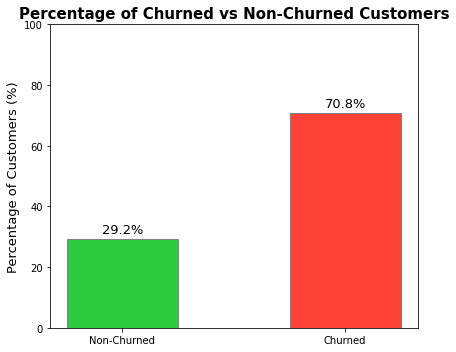

In [0]:

%python
#Churned Vs Not Churned Bar Graph
import matplotlib.pyplot as plt

# Loading table 
df_spark = spark.table("final_features")
df = df_spark.toPandas()

# Count churn vs non-churn
counts = df['churn_label'].value_counts().sort_index()
total = counts.sum()
percentages = counts / total * 100

labels = ['Non-Churned', 'Churned']
colors = ['#2ecc40', '#ff4136']  

plt.figure(figsize=(6, 5))
bars = plt.bar(labels, percentages, color=colors, width=0.5, edgecolor='gray')

plt.ylabel('Percentage of Customers (%)', fontsize=13)
plt.title('Percentage of Churned vs Non-Churned Customers', fontsize=15, fontweight='bold')
plt.ylim(0, 100)

# Add percentage labels on top of bars
for bar, pct in zip(bars, percentages):
    plt.text(bar.get_x() + bar.get_width()/2, pct + 1, f'{pct:.1f}%', 
             ha='center', va='bottom', fontsize=13)

plt.tight_layout()
plt.show()

In [0]:
--churn labels distribution per customer
WITH customer_labels AS (
  SELECT 
    customer_id,
    MAX(CASE WHEN churn_label = 1 THEN 1 ELSE 0 END) AS has_1,
    MAX(CASE WHEN churn_label = 0 THEN 1 ELSE 0 END) AS has_0
  FROM final_features
  GROUP BY customer_id
)
SELECT 
  SUM(CASE WHEN has_1 = 1 AND has_0 = 1 THEN 1 ELSE 0 END) AS customers_with_both_labels,
  SUM(CASE WHEN has_1 = 1 AND has_0 = 0 THEN 1 ELSE 0 END) AS only_churn_label_1,
  SUM(CASE WHEN has_1 = 0 AND has_0 = 1 THEN 1 ELSE 0 END) AS only_churn_label_0
FROM customer_labels;


customers_with_both_labels,only_churn_label_1,only_churn_label_0
8745,2,250


In [0]:
-- Splitting the  reference_date for temporal evaluation
CREATE OR REPLACE TABLE final_features_split AS
SELECT
    *,
    CASE
        WHEN reference_date BETWEEN '2020-07-22' AND '2021-09-30' THEN 'train'
        WHEN reference_date BETWEEN '2021-10-01' AND '2022-01-15' THEN 'validation'
        WHEN reference_date BETWEEN '2022-01-16' AND '2022-03-22' THEN 'test'
        ELSE NULL
    END AS data_split
FROM final_features;




num_affected_rows,num_inserted_rows


In [0]:
%python
#Data modelling for training, validation, and final test evaluation
#   Load the split feature table into Python for modeling
df = spark.table("final_features_split").toPandas()

# Create X, y splits for modeling
train_df = df[df['data_split'] == 'train']
val_df = df[df['data_split'] == 'validation']
test_df = df[df['data_split'] == 'test']

 # Separate features and labels
feature_cols = [col for col in df.columns if col not in ['customer_id', 'reference_date', 'churn_label', 'data_split']] 

X_train = train_df[feature_cols]
y_train = train_df['churn_label']
X_val = val_df[feature_cols]
y_val = val_df['churn_label']
X_test = test_df[feature_cols]
y_test = test_df['churn_label']

#Check distribution across splits
print(df['data_split'].value_counts())



train         566811
validation    134955
test           80973
Name: data_split, dtype: int64


**Model Training And Hyper Parameter Tuning**

In [0]:
%python
#loading data for final modelling
CV_data = df.copy()
CV_data = CV_data.sort_values(['customer_id', 'reference_date']).reset_index(drop=True)
CV_data['idx'] = CV_data.index

In [0]:
%python
#SELECTING validation folds
validation_dates = CV_data['reference_date'].drop_duplicates().sort_values().tolist()

validation_dates = validation_dates[::4]
cv = []
for val_date in validation_dates:
    train_idx = CV_data.index[df['reference_date'] < val_date].tolist()
    val_idx = CV_data.index[df['reference_date'] == val_date].tolist()
    
    if len(train_idx) > 0 and len(val_idx) > 0:
        cv.append((train_idx, val_idx))

#  feature columns excluding customer_id, reference_date, churn_label
feature_cols = [col for col in CV_data.columns if col not in [
    'customer_id', 'reference_date', 'churn_label', 'idx','data_split'
    
]]
X = df[feature_cols]
y = df['churn_label']

In [0]:
%python
#Hyper Parameters tuning using GridSearchCV for logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Common hyperparameters to tune:
param_grid = {
    'lr__C': [0.01, 0.1, 1, 10],         # Regularization strength
    'lr__penalty': ['l2'],               # Penalty type
    'lr__solver': ['lbfgs', 'liblinear'] # Solvers compatible with 'l2 regularization'
}
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

logreg_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42))
])
gs_logreg = GridSearchCV(
    logreg_pipeline,
    param_grid,
    cv=cv,                     
    scoring='roc_auc',          
    verbose=2,
    n_jobs=-1
)

gs_logreg.fit(X, y)            

print("Best Logistic Regression Parameters:", gs_logreg.best_params_)
print("Best mean CV AUC score:", gs_logreg.best_score_)

Fitting 21 folds for each of 8 candidates, totalling 168 fits
Best Logistic Regression Parameters: {'lr__C': 10, 'lr__penalty': 'l2', 'lr__solver': 'lbfgs'}
Best mean CV AUC score: 0.7655504397537838


In [0]:
%python
#Generate prediction label on validation set for logistic Regression

best_logreg = gs_logreg.best_estimator_  

# Predicting probabilities
val_preds_logreg = best_logreg.predict(X_val)
val_probs_logreg = best_logreg.predict_proba(X_val)[:, 1]

# Calculate and print validation metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

print("Logistic Regression Validation Results:")
print("Accuracy:   ", accuracy_score(y_val, val_preds_logreg))
print("Precision:  ", precision_score(y_val, val_preds_logreg))
print("Recall:     ", recall_score(y_val, val_preds_logreg))
print("F1 Score:   ", f1_score(y_val, val_preds_logreg))
print("ROC AUC:    ", roc_auc_score(y_val, val_probs_logreg))

Logistic Regression Validation Results:
Accuracy:    0.7905524063576748
Precision:   0.828824310370261
Recall:      0.8858512282029452
F1 Score:    0.8563894646994268
ROC AUC:     0.8249584574870406


 **LGBM**

In [0]:
%python
#Hyper Parameters Tuning Using GridSearch CV for LGBM model
cv = []
for val_date in validation_dates:
    train_idx_lgbm = CV_data.index[df['reference_date'] < val_date].tolist()
    val_idx_lgbm = CV_data.index[df['reference_date'] == val_date].tolist()
    # Only add if both sets have data
    if len(train_idx) > 0 and len(val_idx) > 0:
        cv.append((train_idx, val_idx))
print(f"Number of CV folds: {len(cv)}")
from lightgbm import LGBMClassifier

#Defining Parameter Grid
param_grid = {

    'n_estimators': [100],          
    'max_depth': [-1],              
    'learning_rate': [0.1],         
    'num_leaves': [31]            
}
lgbm = LGBMClassifier(
    class_weight='balanced',      
    random_state=42,
    n_jobs=-1
)
gs_lgb = GridSearchCV(
    lgbm,
    param_grid,
    cv=cv,                
    scoring='roc_auc',    
    verbose=2
)
gs_lgb.fit(X, y)         
print("Best parameters:", gs_lgb.best_params_)
print("Best mean CV AUC score:", gs_lgb.best_score_)

Number of CV folds: 22
Fitting 22 folds for each of 1 candidates, totalling 22 fits
[LightGBM] [Info] Number of positive: 532035, number of negative: 223713
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056330 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1235
[LightGBM] [Info] Number of data points in the train set: 755748, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[CV] END learning_rate=0.1, max_depth=-1, n_estimators=100, num_leaves=31; total time=   7.0s
[LightGBM] [Info] Number of positive: 532035, number of negative: 223713
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enoug

In [0]:
%python
#Generate prediction label on validation set for LightGBM


best_lgb_val = gs_lgb.best_estimator_  

# Preparing validation set
X_val = val_df[feature_cols]        
y_val = val_df['churn_label']      

# Predicting probabilities
val_preds = best_lgb_val.predict(X_val)
val_probs = best_lgb_val.predict_proba(X_val)[:, 1]

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
#  Checking Validation Results for LightGBM

print("LightGBM Validation Results:")
print("Accuracy:   ", accuracy_score(y_val, val_preds))
print("Precision:  ", precision_score(y_val, val_preds))
print("Recall:     ", recall_score(y_val, val_preds))
print("F1 Score:   ", f1_score(y_val, val_preds))
print("ROC AUC:    ", roc_auc_score(y_val, val_probs))

LightGBM Validation Results:
Accuracy:    0.7770219702863917
Precision:   0.8451318512230063
Recall:      0.8371015041150317
F1 Score:    0.8410975107459313
ROC AUC:     0.8228254056362523


**Random Forest**

In [0]:
%python
#Hyper Parameters tuning using GridSearchCV for Random Forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100],
    'max_depth': [None],
    'min_samples_split': [2]
}

rf = RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1)

gs = GridSearchCV(
    rf, param_grid,
    cv=cv,                  
    scoring='roc_auc',      
    verbose=2
)
gs.fit(X, y)

print("Best parameters:", gs.best_params_)
print("Best CV score:", gs.best_score_)

Fitting 22 folds for each of 1 candidates, totalling 22 fits
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  58.2s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  53.9s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  53.7s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  53.9s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  52.9s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  52.2s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=  52.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time= 1.3min
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time= 1.4min
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time= 1.6min
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time= 1.6min
[CV] END max_depth=None, m

In [0]:
%python
#Generate prediction label on validation set
best_rf = gs.best_estimator_ 
X_val = val_df[feature_cols]        
y_val = val_df['churn_label']       

# Predicting validation probabilities
val_preds = best_rf.predict(X_val)
val_probs = best_rf.predict_proba(X_val)[:, 1]


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
# Printing Validation Metrics For Random Forest

print("Random Forest Validation Results:")
print("Accuracy:   ", accuracy_score(y_val, val_preds))
print("Precision:  ", precision_score(y_val, val_preds))
print("Recall:     ", recall_score(y_val, val_preds))
print("F1 Score:   ", f1_score(y_val, val_preds))
print("ROC AUC:    ", roc_auc_score(y_val, val_probs))

Random Forest Validation Results:
Accuracy:    0.8884368863695306
Precision:   0.8688862888886841
Recall:      0.9913389882172401
F1 Score:    0.9260823031528922
ROC AUC:     0.896093792896361


# **Retraining the best model on train and vallidation and predicting on test set**

In [0]:
%python
#final training of selected model(random forest) on train and validation data
# Use all data except test for final model fit
final_train_df = df[df['data_split'].isin(['train', 'validation'])]  

final_X_train = final_train_df[feature_cols]
final_y_train = final_train_df['churn_label']

In [0]:
%python
# Prediction on unseen(test) data using final evaluated model
best_rf = gs.best_estimator_   
best_rf.fit(final_X_train, final_y_train)
test_df = df[df['data_split'] == 'test']
final_X_test = test_df[feature_cols]
final_y_test = test_df['churn_label']
test_preds = best_rf.predict(final_X_test)
test_probs = best_rf.predict_proba(final_X_test)[:, 1]

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

#Printing Testing Results
print("Test Accuracy:", accuracy_score(final_y_test, test_preds))
print("Test Precision:", precision_score(final_y_test, test_preds))
print("Test Recall:", recall_score(final_y_test, test_preds))
print("Test F1:", f1_score(final_y_test, test_preds))
print("Test ROC AUC:", roc_auc_score(final_y_test, test_probs))

Test Accuracy: 0.8243859064132488
Test Precision: 0.8629649679065811
Test Recall: 0.9123538549587115
Test F1: 0.8869724187266513
Test ROC AUC: 0.7992509136717012


# **Feature Importance**

In [0]:
%python
#Calculate permutation feature importance on the validation set using the trained Random Forest model

from sklearn.inspection import permutation_importance
import pandas as pd
 
result = permutation_importance(
    best_rf,      
    X_val,           
    y_val,            
    n_repeats=10,     
    random_state=42,
    scoring='roc_auc' 
)
#Organize the importance results into a DataFrame and sort by importance descending

perm_importances = pd.DataFrame({
    'feature': feature_cols,
    'importance': result.importances_mean,
    'std': result.importances_std
}).sort_values('importance', ascending=False)
 
 
 

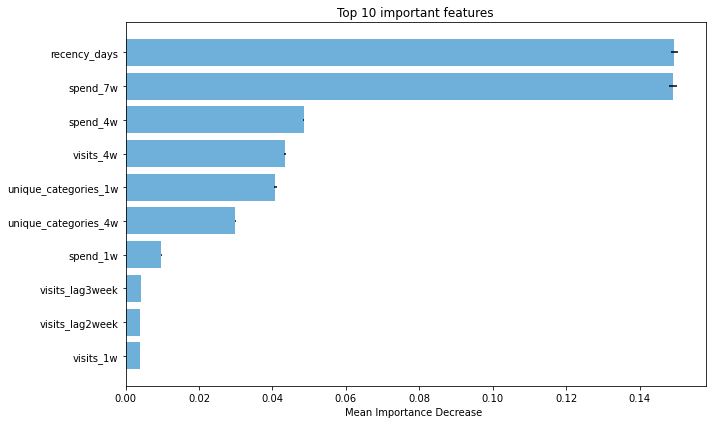

In [0]:
%python
#  Graph for feature Importance
plt.figure(figsize=(10, 6))
plt.barh(perm_importances['feature'][:10][::-1], perm_importances['importance'][:10][::-1],
         xerr=perm_importances['std'][:10][::-1], color="#4B9CD3", alpha=0.8)
plt.xlabel('Mean Importance Decrease ')
plt.title('Top 10 important features')
plt.tight_layout()
plt.show()
 

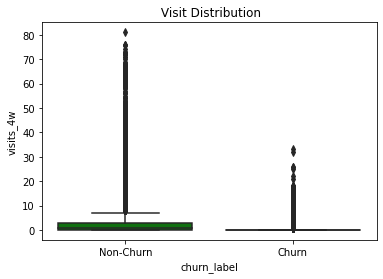

In [0]:
%python
#Churn vs non week visit in 4 week timeframe before reference date
import seaborn as sns
features = ['visits_4w']
for feat in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(data=df, x='churn_label', y=feat, palette={0: 'green', 1: 'red'})
    plt.xticks([0,1], ['Non-Churn', 'Churn'])
    plt.title(f' Visit Distribution')
    plt.show()

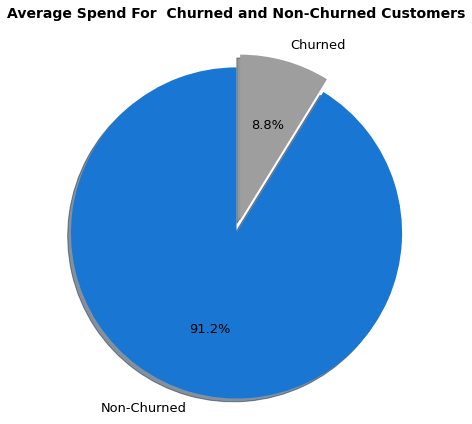

In [0]:
%python
#Churned Vs Non Churned Average Spend
import matplotlib.pyplot as plt

# Calculating average spend 
avg_spend = df.groupby('churn_label')['spend_4w'].mean()
labels = ['Non-Churned', 'Churned']
colors = ['#1976d2', '#9e9e9e']  

plt.figure(figsize=(6, 6))
plt.pie(
    avg_spend,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',   
    startangle=90,
    explode=(0, 0.08),
    shadow=True,
    textprops={'fontsize': 13, 'color': 'black'}
)
plt.title('Average Spend For  Churned and Non-Churned Customers', fontsize=14, fontweight='bold', pad=20)
plt.axis('equal')
plt.tight_layout()
plt.show()

In [0]:
%python
# Finding the latest churn status for each customer
latest_churn_status = df.groupby('customer_id')['churn_label'].max().reset_index()

# Differentiating churned and non-churned customers based on the latest churn status
churned_customers = latest_churn_status[latest_churn_status['churn_label'] == 1]['customer_id']
non_churned_customers = latest_churn_status[latest_churn_status['churn_label'] == 0]['customer_id']

# Converting relevant tables to pandas dataframe
products_df= spark.sql('SELECT * FROM products').toPandas()
receipt_lines_df= spark.sql('SELECT * FROM receipt_lines').toPandas()
receipts_df= spark.sql('SELECT * FROM receipts').toPandas()

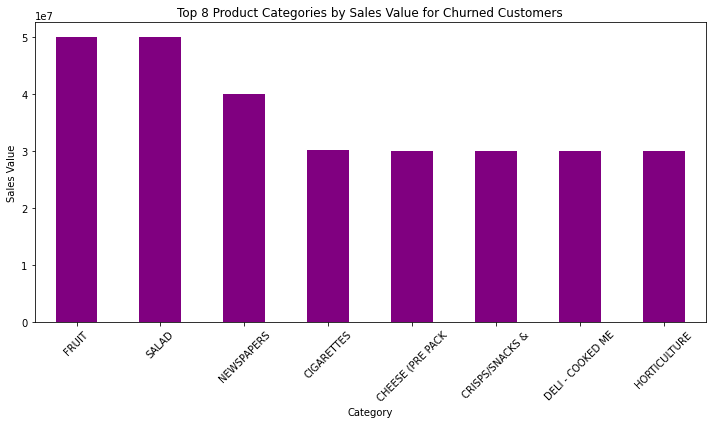

In [0]:
%python
import pandas as pd
# Top product categories of customers who churned
# Join receipts_df with receipt_lines_df on receipt_id
merged_df = pd.merge(receipts_df, receipt_lines_df, on='receipt_id')

# Join the resulting DataFrame with products_df on product_code
merged_df = pd.merge(merged_df, products_df, on='product_code')

# Filter for churned customers
churned_sales = merged_df[merged_df['customer_id'].isin(churned_customers)]

# Group by department and calculate total sales value
churned_sales_by_department = churned_sales.groupby('category_details')['value'].sum().nlargest(8)

# Plot bar graph
plt.figure(figsize=(10, 6))
churned_sales_by_department.plot(kind='bar',  color='purple')
plt.title('Top 8 Product Categories by Sales Value for Churned Customers')
plt.xlabel('Category')
plt.ylabel('Sales Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

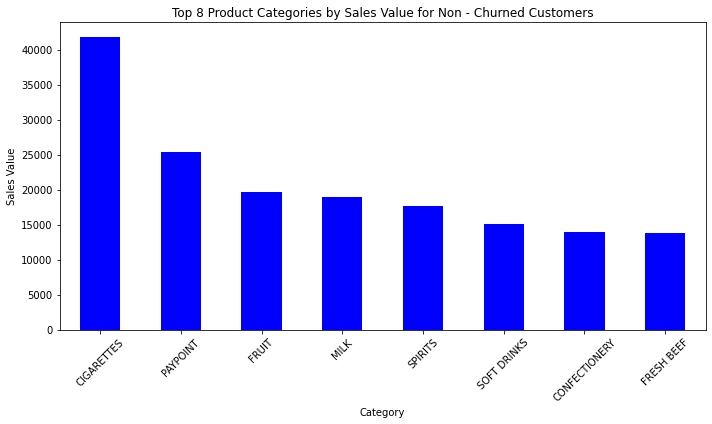

In [0]:
%python
# Top product categories of customers who did not churn
# Filter for churned customers
non_churned_sales = merged_df[merged_df['customer_id'].isin(non_churned_customers)]

# Group by department and calculate total sales value
non_churned_sales_by_department = non_churned_sales.groupby('category_details')['value'].sum().nlargest(8)

# Plot bar graph
plt.figure(figsize=(10, 6))
non_churned_sales_by_department.plot(kind='bar', color='blue')
plt.title('Top 8 Product Categories by Sales Value for Non - Churned Customers')
plt.xlabel('Category')
plt.ylabel('Sales Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


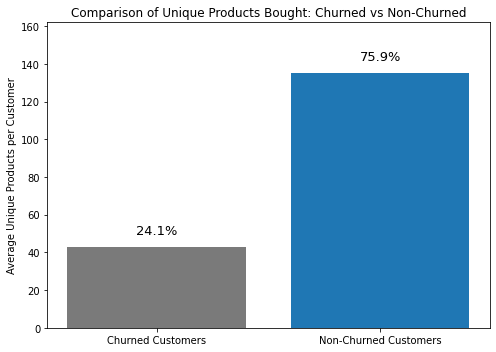

In [0]:
%python
#   Bar Graph to plot Unique categories brought by churned vs non churn customers
# Importing tables
churn_labels_df = spark.table("customer_churn_labels").toPandas()


# Join receipts and receipt_lines to get product info per receipt
receipt_sales = receipts_df.merge(receipt_lines_df, on='receipt_id', how='left')

# Attaching churn label (latest churn status per customer)
latest_churn_labels = churn_labels_df.sort_values('reference_date').groupby('customer_id').tail(1)[['customer_id', 'churn_label']]
receipt_sales = receipt_sales.merge(latest_churn_labels, on='customer_id', how='left')

# Split churned and non-churned customers
churned_sales = receipt_sales[receipt_sales['churn_label'] == 1]
non_churned_sales = receipt_sales[receipt_sales['churn_label'] == 0]

# Calculate average unique products per customer
avg_unique_products_churned = churned_sales.groupby('customer_id')['product_code'].nunique().mean()
avg_unique_products_non_churned = non_churned_sales.groupby('customer_id')['product_code'].nunique().mean()

# Step : Bar Graph Plot with percent labels
import matplotlib.pyplot as plt

labels = ['Churned Customers', 'Non-Churned Customers']
values = [avg_unique_products_churned, avg_unique_products_non_churned]
total = sum(values)
percentages = [(v/total)*100 for v in values]

plt.figure(figsize=(7,5))
bars = plt.bar(labels, values, color=['#7a7a7a', '#1f77b4'])

plt.ylabel('Average Unique Products per Customer')
plt.title('Comparison of Unique Products Bought: Churned vs Non-Churned')
plt.ylim(0, max(values)*1.2)

# Display percent value on top of each bar
for bar, pct in zip(bars, percentages):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(values)*0.04, f'{pct:.1f}%', 
             ha='center', va='bottom', fontsize=13, color='black')

plt.tight_layout()
plt.show()